In [110]:
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [111]:
PYTHON_PATHS = [".."]
import sys
for path in PYTHON_PATHS:
    if path not in sys.path:
        sys.path.append(path)

from imap.data.image_rendering_data_module import ImageRenderingDataModule
from pytorch_lightning.utilities.parsing import AttributeDict
import os
from pathlib import Path
import torch
from tqdm.notebook import tqdm

import cv2
import matplotlib.pyplot as plt
import numpy as np
import plotly.graph_objects as go
import plotly.express as px
from imap.utils.torch_math import *
from imap.utils.utils import *

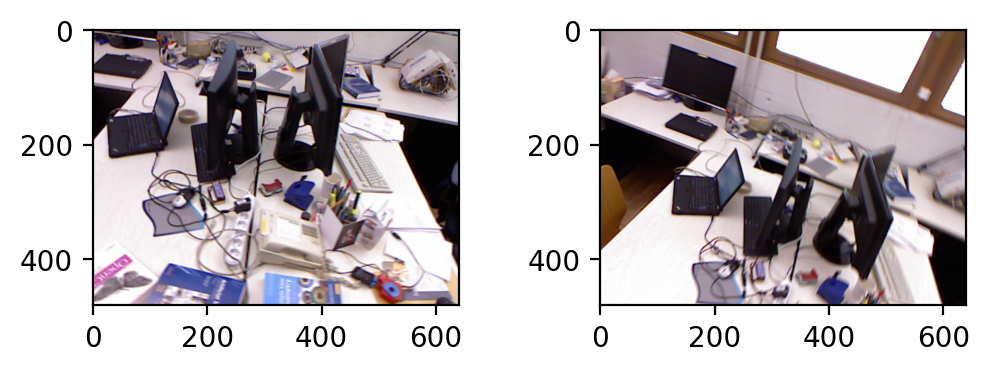

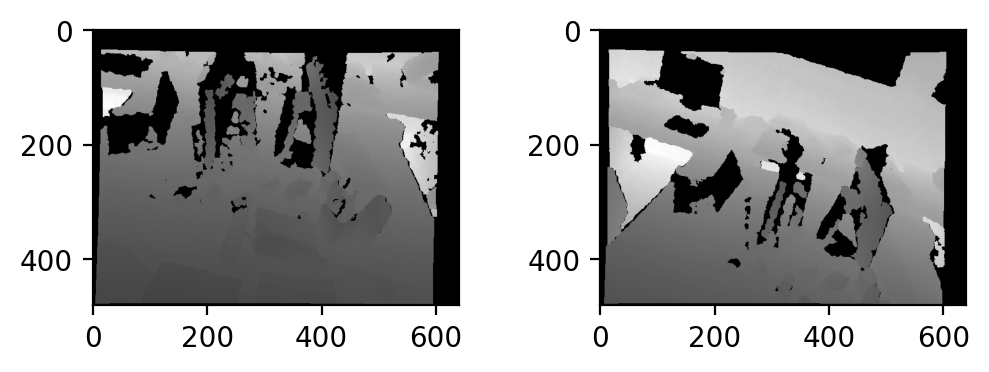

In [112]:
frames = [0, 2]
test_images_list = [
"1305031458.159638.png", "1305031462.692548.png", "1305031464.959763.png","1305031467.695886.png",  "1305031469.296754.png"
]
test_depthes_list = [
    "1305031458.144808.png", "1305031462.680788.png", "1305031464.952471.png", "1305031467.686044.png", "1305031469.288263.png"
]
color_image_path1 = str(Path(f"../test/datasets/tum rgbd/rgbd_dataset_freiburg1_desk/rgb/{test_images_list[frames[0]]}"))
depth_image_path1 = str(Path(f"../test/datasets/tum rgbd/rgbd_dataset_freiburg1_desk/depth/{test_depthes_list[frames[0]]}"))

color_image_path2 = str(Path(f"../test/datasets/tum rgbd/rgbd_dataset_freiburg1_desk/rgb/{test_images_list[frames[1]]}"))
depth_image_path2 = str(Path(f"../test/datasets/tum rgbd/rgbd_dataset_freiburg1_desk/depth/{test_depthes_list[frames[1]]}"))


figure = plt.figure(dpi=200)
color_image1 = cv2.imread(color_image_path1)
plt.subplot(2,2,1)
plt.imshow(cv2.cvtColor(color_image1, cv2.COLOR_RGB2BGR))


color_image2 = cv2.imread(color_image_path2)
plt.subplot(2,2,2)
plt.imshow(cv2.cvtColor(color_image2, cv2.COLOR_RGB2BGR))

factor = 5000 # for the 16-bit PNG files
# OR: factor = 1 # for the 32-bit float images in the ROS bag files

figure = plt.figure(dpi=200)
plt.subplot(2,2,3)
depth_image1 = cv2.imread(depth_image_path1, -1).astype(np.float32) / factor
depth_image1 = np.clip(depth_image1, 0, 4)
plt.imshow(depth_image1, cmap="gray")


depth_image2 = cv2.imread(depth_image_path2, -1).astype(np.float32) / factor
depth_image2 = np.clip(depth_image2, 0, 4)
plt.subplot(2,2,4)
plt.imshow(depth_image2, cmap="gray")

In [113]:
dataset_params = {
    'dataset_path': "../test/datasets/tum rgbd/",
    'scene_name': "rgbd_dataset_freiburg1_desk", 
    'association_file_name': "data_association_file.txt", 
    'frame_indices': [131, 257, 325, 407, 455], # association file raw - 1
    'distance_koef': 0.1,
    'clip_distance_threshold': 4.,
    'batch_size':4096
                 }
data_module = ImageRenderingDataModule('tum', **dataset_params)

Reading ../test/datasets/tum rgbd/rgbd_dataset_freiburg1_desk/data_association_file.txt
Read (5, 480, 640, 3) images array
Dataset size: 1536000 pixels
[ToyDataModule] - train subset size 1536000


In [114]:
scale = 1
x, y = generate_image_meshgrid(color_image1.shape[0], color_image1.shape[1], scale)

In [115]:
get_pixels_from_meshgrid(x, y, scale)

array([[  0,   0],
       [  1,   0],
       [  2,   0],
       ...,
       [637, 479],
       [638, 479],
       [639, 479]], dtype=int32)

In [119]:
inverted_camera_matrix = torch.tensor(data_module._dataset._camera_info.get_inverted_camera_matrix().astype(np.float32))
scale = 1

depth_image1 = data_module._dataset._depth_images[frames[0]]
position1 = torch.tensor(data_module._dataset._positions[frames[0]])
# position1 = torch.repeat_interleave(position1[None], depth_image1.shape[0]*depth_image1.shape[1]//(scale**2), dim=0)

depth_image2 = data_module._dataset._depth_images[frames[1]]
position2 = torch.tensor(data_module._dataset._positions[frames[1]])
# position2 = torch.repeat_interleave(position2[None], depth_image2.shape[0]*depth_image2.shape[1]//(scale**2), dim=0)

print(position1.shape)
print(position1)
print(position2)

def get_point_cloud(depth_image, position, inverted_camera_matrix, scale=1):
    x, y = generate_image_meshgrid(depth_image.shape[0], depth_image.shape[1], scale)       
    pixels = get_pixels_from_meshgrid(x, y, scale)
    
    depths = torch.tensor(get_depths_in_pixels(depth_image, pixels)).float()
    pixels = torch.tensor(pixels.astype(np.float32))

    return back_project_pixel(pixels, depths, position, inverted_camera_matrix).cpu().detach().numpy()



torch.Size([4, 4])
tensor([[ 0.9914,  0.1184,  0.0552,  0.0231],
        [ 0.0323, -0.6314,  0.7748, -0.0324],
        [ 0.1266, -0.7664, -0.6298,  0.1691],
        [ 0.0000,  0.0000,  0.0000,  1.0000]])
tensor([[ 0.9397,  0.3413, -0.0200,  0.0041],
        [ 0.1840, -0.4555,  0.8710, -0.0378],
        [ 0.2881, -0.8222, -0.4909,  0.1868],
        [ 0.0000,  0.0000,  0.0000,  1.0000]])


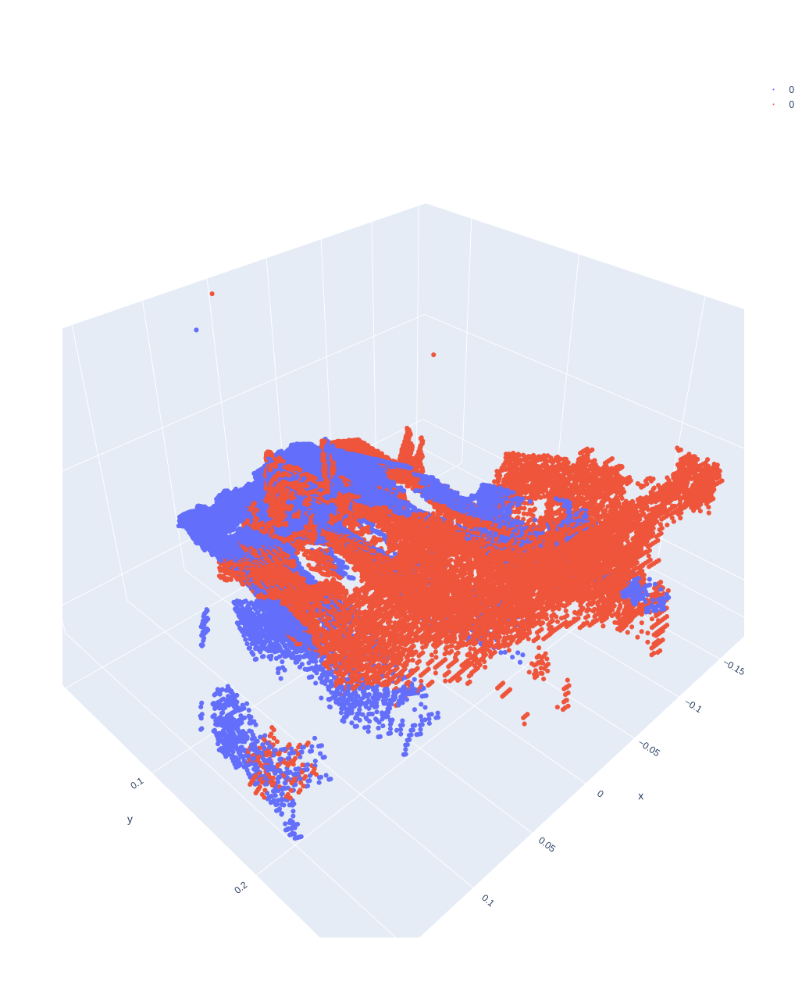

In [117]:


points0 = get_point_cloud(depth_image1, position1, inverted_camera_matrix, scale=scale)
points1 = get_point_cloud(depth_image2, position2, inverted_camera_matrix, scale=scale)


fig = go.Figure(
    data=[
        go.Scatter3d(x=points0[::10, 0],
                     y=points0[::10, 1], 
                     z=points0[::10, 2],
                     mode="markers",
                     name="0",
                     marker={
                         "size": 2
                     }),
                go.Scatter3d(x=points1[::10, 0],
                     y=points1[::10, 1], 
                     z=points1[::10, 2],
                     mode="markers",
                     name="0",
                     marker={
                         "size": 2
                     }),
    ],
)
fig.update_layout(height=1280,width=960)
fig.show()

